## My Lab 17
- This lab focusses on **tensor products in quantum**
- **WHY?** almost all quantum circuits - entanglement, teleportation and major algorithms involve multi-qubit states 
- How to use numpy and by hand to do tensor products
- Phi state and QASM simulator are the optional contents


- Any **n** qubit state has $$2^{n}$$ basis states 

- Any n qubit system can be written as a linear combination of these basis states

- Example - > a 2-qubit state can be written as a linear combination of the states 
    $$ |00\rangle,|01\rangle,|10\rangle\ and\ |11\rangle$$

## Tensor Products
- They just a way to mathematically represent the **multi-qubit** states
- They are evaluated as rules of a regular tensor product 
- The resultant tensor for 2 tensors of shape **n x m** and **p x q** is of the order **n.p X m.q**

### Using numpy
- We'll use the numpy function np.kron(a,b), which computes the tensor product of vectors a and b. kron stands for Kronecker product, which is another name for the tensor product.

In [1]:
from qiskit import QuantumCircuit, execute, Aer
from qiskit.visualization import plot_histogram
import numpy as np

E:\ANACONDA\lib\site-packages\requests\__init__.py:91: RequestsDependencyWarning: urllib3 (1.26.3) or chardet (3.0.4) doesn't match a supported version!
  RequestsDependencyWarning)


### Two-qubit state
- Right indexing is used in the code
- Since, qiskit uses right indexing we are using indexing like 
$$|q_{n}q_{n-1}...q_{1}q_{0}\rangle$$

In [11]:
# right indexing is used
q0 = np.array([[1],
               [0]]) #|0>
q1 = np.array([[0],
               [1]]) #|1>
result = np.kron(q1,q0)
print("The |10> (q1 q0) state :\n",result)

The |10> (q1 q0) state :
 [[0]
 [0]
 [1]
 [0]]


In [15]:
#third qubit 
q2 = np.array([[0],
              [1]]) # |1>
# answer should be 6
print("Yes, the resulting state (q2 q1 q0) is the 6 equivalent of the binary representations")
print(np.kron(q2,result))


Yes, the resulting state (q2 q1 q0) is the 6 equivalent of the binary representations
[[0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [1]
 [0]]


### Tensor products on matrices

In [18]:
X = np.array([[0,1],
              [1,0]])
Z = np.array([[1,0],
              [0,-1]])
print("X kronecker Z :\n",np.kron(X,Z))
print("Z kronecker X :\n",np.kron(Z,X))

X kronecker Z :
 [[ 0  0  1  0]
 [ 0  0  0 -1]
 [ 1  0  0  0]
 [ 0 -1  0  0]]
Z kronecker X :
 [[ 0  1  0  0]
 [ 1  0  0  0]
 [ 0  0  0 -1]
 [ 0  0 -1  0]]


- We see that the commtativity does not hold true

## QASM simulator
- Making the $$|\Phi^{-}\rangle = \frac{1}{\sqrt{2}}(|00\rangle - |11\rangle)$$ state
- The relative phase is the only difference between phi+ and phi- then
- How do we create this?
- Two ways :
     - apply a Z over the first qubit or the second qubit of the circuit
     - or initially have a |-> state in the control qubit

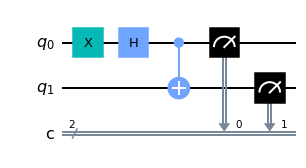

In [34]:
q = QuantumCircuit(2,2)
q.x(0)
q.h(0)
q.cx(0,1)
q.measure([0,1],[0,1])
q.draw('mpl')

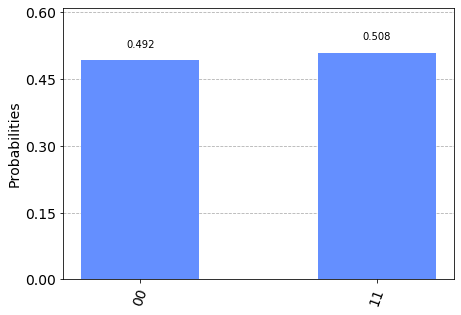

In [35]:
backend = Aer.get_backend('qasm_simulator')
result = execute(q,backend, shots = 1300).result()
counts = result.get_counts()
plot_histogram(counts)

### Another way


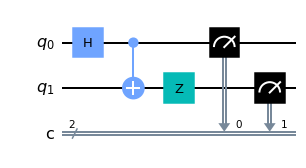

In [52]:
q = QuantumCircuit(2,2)
q.h(0)
q.cx(0,1)
q.z(1)
q.measure([0,1],[0,1])
q.draw('mpl')

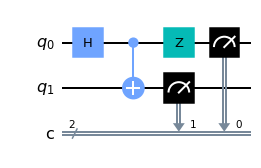

In [53]:
q = QuantumCircuit(2,2)
q.h(0)
q.cx(0,1)
q.z(0)
q.measure([0,1],[0,1])
q.draw('mpl')

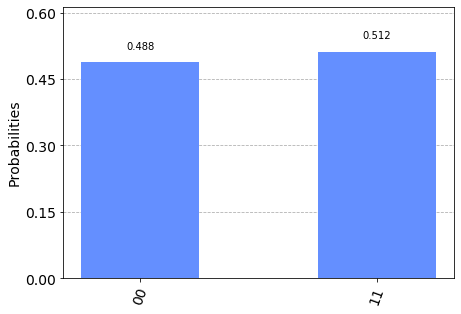

In [55]:
backend = Aer.get_backend('qasm_simulator')
result = execute(q,backend, shots = 1300).result()
counts = result.get_counts()
plot_histogram(counts)

- NOTE : the plot_histogram does not give you any kind of information about **the relative phase** 

## A nice way to visualize the single qubit circuits

In [58]:
from qiskit.tools.visualization import transition_visualization

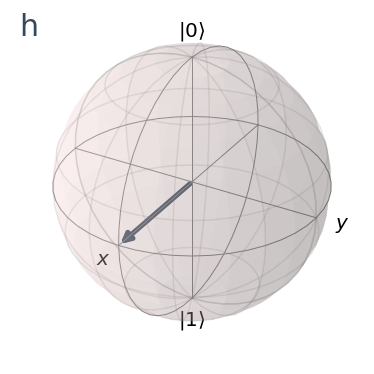

In [67]:
q = QuantumCircuit(1)
q.h(0)
transition_visualization.visualize_transition(q)